In [186]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import math

#Basic concept

First, gradient magnitude is used to compute a measure of edge strength.


Next, the gradient direction (the local orientation of the edge) is used to search for local directional maxima of the gradient magnitude.

**Central derivative**

$\frac{d}{dx}f(x)=\displaystyle \lim_{Δx\to 0} \frac{f(x+\frac{Δx}{2}) - f(x-\frac{Δx}{2})} {Δx}$

**A one-sided derivative**

$\frac{d}{dx}f(x)=\displaystyle \lim_{Δx\to 0} \frac{f(x+Δx) - f(x)} {Δx}$



In [188]:
#gradient in X direction (Central derivative)
def gradient_X(f_x, x_filter):
  df_x = []
  for i in range(len(f_x)):
    if i + x_filter[0][0] < 0:
      avl_val = f_x[:i+x_filter[0][-1]+1]
      df_x.append(avl_val@x_filter[0][-len(avl_val):])
    elif i + x_filter[0][-1] >= len(f_x):
      avl_val = f_x[i + x_filter[0][0]:]
      df_x.append(avl_val@x_filter[0][-len(avl_val):])
    else:
      avl_val = f_x[i + x_filter[0][0]:i+x_filter[0][-1]+1]
      df_x.append(avl_val@x_filter[0])
  return np.array(df_x)

In [189]:
#gradient in X direction (Central derivative)
f_x = np.array([32,30,45,36,160,156,155,170])
x_filter = np.array([[-2,-1,0,1,2]])
print(gradient_X(f_x, x_filter))

[120 85 262 367 340 263 335 495]


In [190]:
#gradient in Y direction (Central derivative)
def gradient_Y(f_x, y_filter):
  df_y = []
  for i in range(len(f_x)):
    if i + y_filter[0] < 0:
      avl_val = f_x[:i+y_filter[-1][0]+1]
      df_y.append(sum(avl_val*y_filter[-len(avl_val):]))
    elif i + y_filter[-1] >= len(f_x):
      avl_val = f_x[i + y_filter[0][0]:]
      df_y.append(sum(avl_val*y_filter[-len(avl_val):]))
    else:
      avl_val = f_x[i + y_filter[0][0]:i+y_filter[-1][0]+1]
      df_y.append(sum(avl_val*y_filter))
  return np.array(df_y)

In [191]:
#gradient in Y direction (Central derivative)
f_x = np.array([[32],[30],[45],[36],[160],[156],[155],[170]])
y_filter = np.array([[-2],[-1],[0],[1],[2]])
print(gradient_Y(f_x, y_filter))

[[120]
 [85]
 [262]
 [367]
 [340]
 [263]
 [335]
 [495]]


#Edge detection using gradient (Central derivative)

(500, 1200)


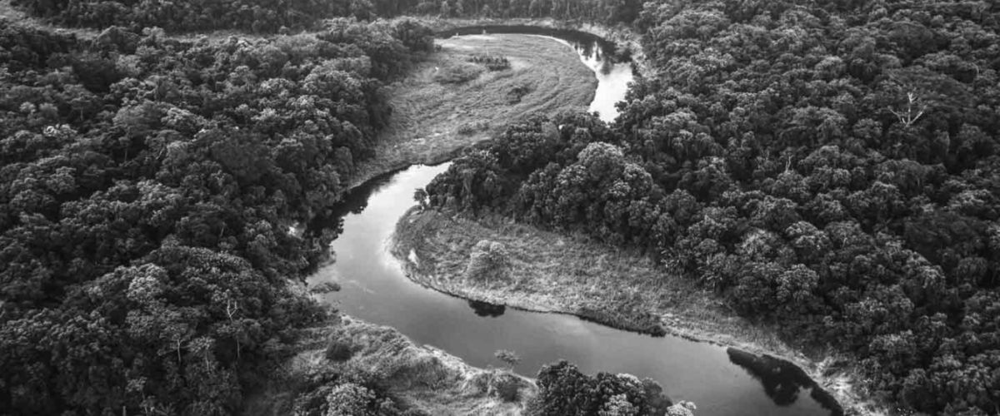

In [192]:
#Show the original image
img = cv2.imread('nature.jpg', 0)
print(img.shape)
cv2_imshow(img)

##Edge detection using gradient in X direction


In [193]:
# Caculate gradient in X- direction
def computeXDerivative (image, x_filter = np.array([[-1,0,1]])):
  h, w = image.shape
  new_image = []
  for hei in range(h):
    x_derivative = []
    for wei in range(w):
      if wei + x_filter[0][0] < 0:
        avl_val = image[hei][:wei+x_filter[0][-1]+1]
        x_derivative.append(avl_val@x_filter[0][-len(avl_val):])
      elif wei + x_filter[0][-1] >= len(image[hei]):
        avl_val = image[hei][wei+ x_filter[0][0]:]
        x_derivative.append(avl_val@x_filter[0][-len(avl_val):])
      else:
        avl_val = image[hei][wei+ x_filter[0][0]:wei+x_filter[0][-1]+1]
        x_derivative.append(avl_val@x_filter[0])
    new_image.append(x_derivative)
  return np.array(new_image)

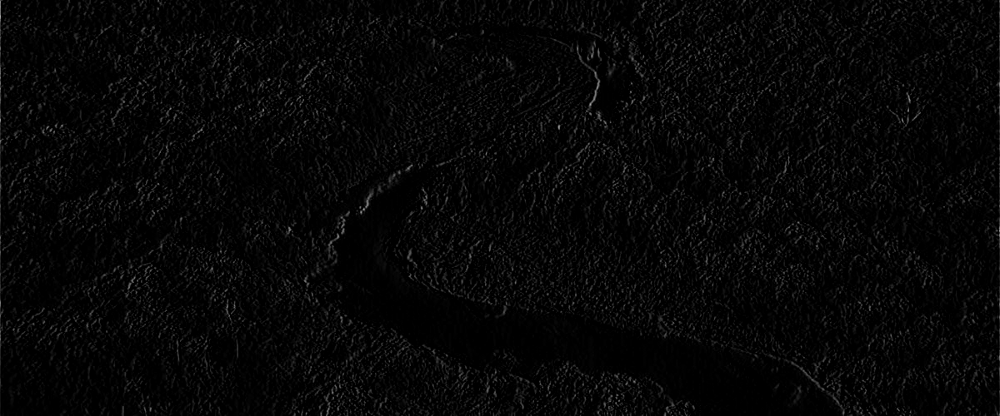

In [194]:
x_derivative = computeXDerivative(img, x_filter = np.array([[-1,0,1]]))
cv2_imshow(x_derivative)

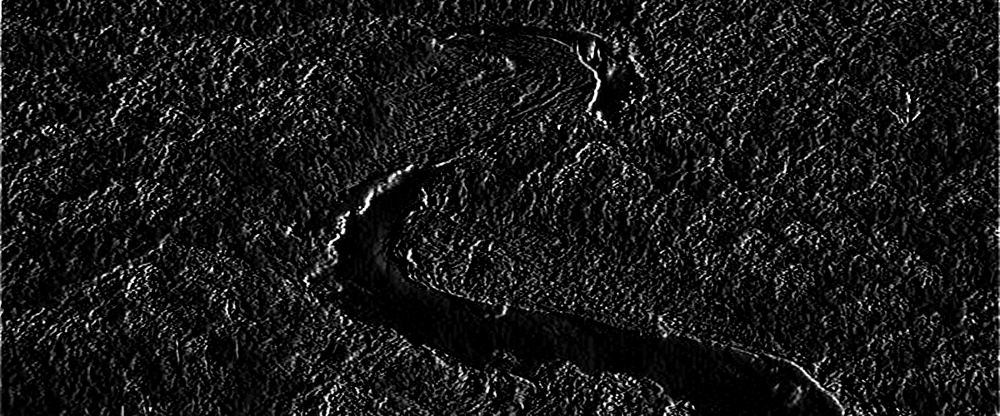

In [195]:
x_derivative = computeXDerivative(img, x_filter = np.array([[-2,-1,0,1,2]]))
cv2_imshow(x_derivative)

##Edge detection using gradient in Y direction

In [196]:
# Caculate gradient in Y- direction
def computeYDerivative (image, y_filter = np.array([[-1],[0],[1]])) :
  h, w = image.shape
  new_image = np.zeros((h, 1))
  for wei in range(w):
    y_derivative = []
    for hei in range(h):
      if hei + y_filter[0] < 0:
        avl_val = image[:,wei:wei+1][:hei+y_filter[-1][0]+1]
        y_derivative.append(sum(avl_val*y_filter[-len(avl_val):]))
      elif hei + y_filter[-1] >= len(image[:,wei:wei+1]):
        avl_val = image[:,wei:wei+1][hei + y_filter[0][0]:]
        y_derivative.append(sum(avl_val*y_filter[-len(avl_val):]))
      else:
        avl_val = image[:,wei:wei+1][hei + y_filter[0][0]:hei+y_filter[-1][0]+1]
        y_derivative.append(sum(avl_val*y_filter))
    new_image = np.append(new_image, y_derivative, axis=1)
  return new_image[:,1:]

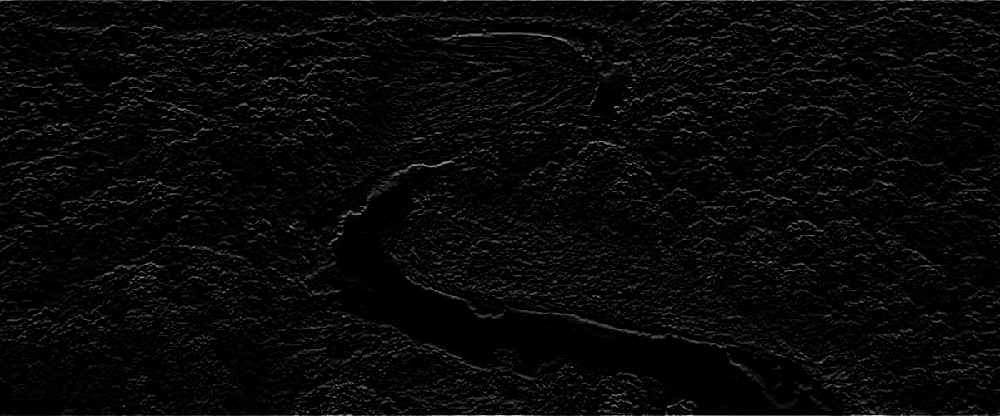

In [197]:
y_derivative = computeYDerivative (img, y_filter = np.array([[-1],[0],[1]]))
cv2_imshow(y_derivative)

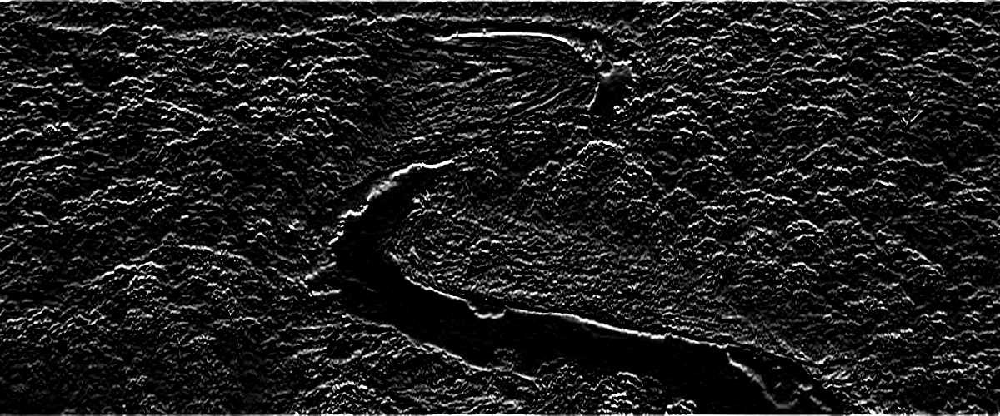

In [198]:
y_derivative = computeYDerivative (img, y_filter = np.array([[-2],[-1],[0],[1],[2]]))
cv2_imshow(y_derivative)

##Edge detection using gradient in X and Y directions

In [199]:
# Calculate the gradient magnitude
def computeMagniguteXY(image, filter = np.array([[-1,0,1]])):
  XDerivative = computeXDerivative (image, filter)
  YDerivative = computeYDerivative (image, filter.transpose())
  gradient_magnitude = np.round(np.sqrt(XDerivative**2 + YDerivative**2),1)
  return XDerivative, YDerivative, gradient_magnitude

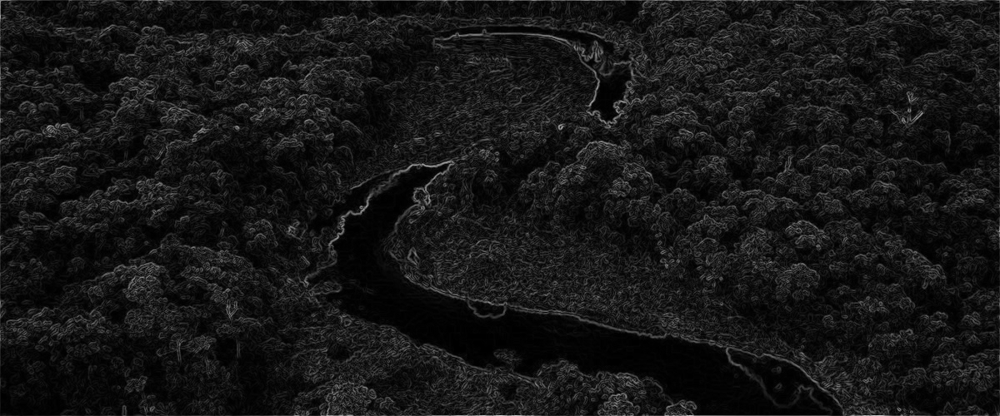

In [200]:
XDerivative, YDerivative, gradient_magnitude = computeMagniguteXY (img, filter = np.array([[-1,0,1]]))
cv2_imshow(gradient_magnitude)

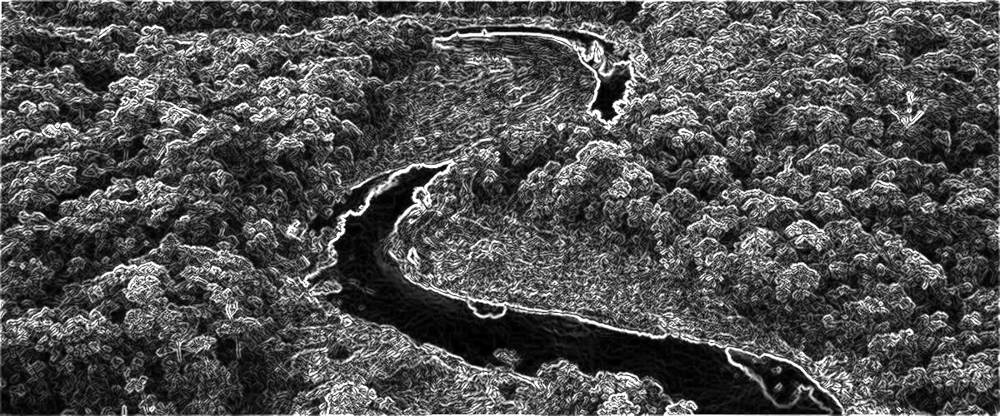

In [201]:
XDerivative, YDerivative, gradient_magnitude = computeMagniguteXY (img, filter = np.array([[-2,-1,0,1,2]]))
cv2_imshow(gradient_magnitude)

Text(0.5, 1.0, 'Gradient Magnitude ')

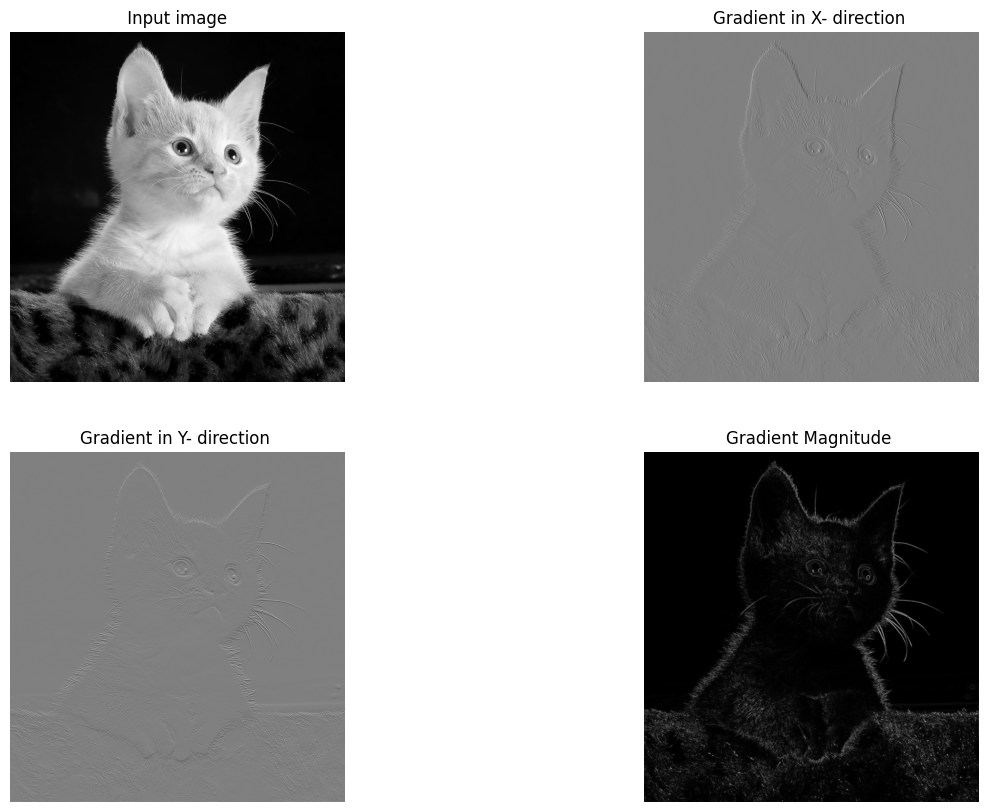

In [202]:
#Original image
img = cv2.imread('cat.jpeg', 0)

#Edge detection
x_derivative, y_derivative, gradient_magnitude = computeMagniguteXY(img)

# create figure
from matplotlib import pyplot as plt
fig = plt.figure(figsize = (15, 10))

# showing image
fig.add_subplot (2 , 2 , 1)
plt.imshow (img, cmap ="gray")
plt.axis ('off')
plt.title (" Input image ")

fig.add_subplot (2 , 2 , 2)
plt.imshow (x_derivative, cmap ="gray")
plt.axis ('off')
plt.title ("Gradient in X- direction ")

fig.add_subplot (2 , 2 , 3)
plt.imshow (y_derivative, cmap ="gray")
plt.axis ('off')
plt.title ("Gradient in Y- direction ")

fig.add_subplot (2 , 2 , 4)
plt.imshow (gradient_magnitude, cmap ="gray")
plt.axis ('off')
plt.title ("Gradient Magnitude ")

# Edge detection using Sobel operator

**Sobel operator**

***Gradient in X direction***:
- weighted average: $\begin{bmatrix} 1 \\ 2 \\ 1\end{bmatrix}$
- x derivative: $\begin{bmatrix} 1 & 0 & -1\end{bmatrix}$
- Sobel for x direction: $\begin{bmatrix} 1 & 0 & -1 \\ 2 & 0 & -2 \\ 1 & 0 & -1 \end{bmatrix}$
- - $G_x = \begin{bmatrix} 1 & 0 & -1 \\ 2 & 0 & -2 \\ 1 & 0 & -1 \end{bmatrix} * A$, A: original image

***Gradient in Y direction***:
- y derivative: $\begin{bmatrix} 1 \\ 0 \\ -1\end{bmatrix}$
- weighted average: $\begin{bmatrix} 1 & 2 & 1\end{bmatrix}$
- Sobel for y direction: $\begin{bmatrix} 1 & 2 & 1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix}$
- -$G_y = \begin{bmatrix} 1 & 2 & 1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix} * A$

***Gradient in X, Y direction***:

$G=\sqrt{{G_x}^2+{G_y}^2}$

**Another approach**

A kernel filter includes 2 components: a center point ($x_0,y_0$) and neighbor points (x,y). If the position of the center point ($x_0,y_0$) is (0,0), the left of it will be ($x_0$ - n, $y_0$ - n) and ($x_0$ + n, $y_0$ + n) for the right with n in the interval (1: number of the maximum left/right neighbor points). For convenience in the calculation, we will store the x-position and the y-position separately.

*For 5x5 kernel filter:

- Producing the x-position and the y-position:

$x = \begin{bmatrix} -2 & -1 & 0 & 1 & 2\\ -2 & -1 & 0 & 1 & 2 \\ -2 & -1 & 0 & 1 & 2 \\-2 & -1 & 0 & 1 & 2 \\-2 & -1 & 0 & 1 & 2 \end{bmatrix}$,
$y = \begin{bmatrix} -2 & -2 & -2 & -2 & -2\\ -1 & -1 & -1 & -1 & -1 \\ 0 & 0 & 0 & 0 & 0 \\ 1 & 1 & 1 & 1 & 1 \\2 & 2 & 2 & 2 & 2 \end{bmatrix}$

- Then, using x, y and Euclidean distance (L2 norm) between each neighbor point (x, y) and center point (0,0) to produce x_filter, y_filter.

$xfilter = \frac{(x,y)@(1,0)}{\sqrt{x^2 + y^2}} * \frac{1}{\sqrt{x^2 + y^2}} = \frac{x}{x^2 + y^2} = \begin{bmatrix} -1/4 & -1/5 & 0 & 1/5 & 1/4\\ -2/5 & -1/2 & 0 & 1/2 & 2/5 \\ -1/2 & -1 & 0 & 1 & 1/2 \\ -2/5 & -1/2 & 0 & 1/2 & 2/5 \\-1/4 & -1/5 & 0 & 1/5 & 1/4 \end{bmatrix}$

$yfilter = \frac{(x,y)@(0,1)}{\sqrt{x^2 + y^2}} * \frac{1}{\sqrt{x^2 + y^2}} = \frac{y}{x^2 + y^2} = \begin{bmatrix} -1/4 & -2/5 & -1/2 & -2/5 & -1/4\\ -1/5 & -1/2 & -1 & -1/2 & -1/5 \\ 0 & 0 & 0 & 0 & 0 \\ 1/5 & 1/2 & 1 & 1/2 & 1/5  \\1/4 & 2/5 & 1/2 & 2/5 & 1/4 \end{bmatrix}$

##Creating filter

In [203]:
def create_filter(kernel_size, rm_frac = False):
  remove_frac = {3:2, 5:20, 7: 780, 9:132600}
  center = kernel_size//2
  y = np.zeros((kernel_size, kernel_size))
  for row in range(len(y)):
    if row == 0:
      y[row] = -center
    else:
      y[row] = y[row-1] + 1
  x = y.transpose()
  x_filter = np.divide((x*1+y*0), np.sqrt(x*x + y*y), where=np.sqrt(x*x + y*y)!=0) * np.divide(1, np.sqrt(x*x + y*y), where=np.sqrt(x*x + y*y)!=0)
  y_filter = x_filter.transpose()
  if rm_frac == True:
    return x_filter*remove_frac[kernel_size], y_filter*remove_frac[kernel_size]
  else:
    return x_filter, y_filter

In [204]:
import fractions
np.set_printoptions(formatter={'all':lambda x: str(fractions.Fraction(x).limit_denominator())})

In [205]:
x_filter, y_filter = create_filter(3)
f_x_filter, f_y_filter = create_filter(3, rm_frac = True)
print(f'x_filter:\n {x_filter}, \n or: \n{f_x_filter}')
print(f'y_filter:\n {y_filter},\n or: \n {f_y_filter}')

x_filter:
 [[-1/2 0 1/2]
 [-1 0 1]
 [-1/2 0 1/2]], 
 or: 
[[-1 0 1]
 [-2 0 2]
 [-1 0 1]]
y_filter:
 [[-1/2 -1 -1/2]
 [0 0 0]
 [1/2 1 1/2]],
 or: 
 [[-1 -2 -1]
 [0 0 0]
 [1 2 1]]


In [206]:
x_filter, y_filter = create_filter(5)
f_x_filter, f_y_filter = create_filter(5, rm_frac = True)
print(f'x_filter:\n {x_filter}, \n or: \n{f_x_filter}')
print(f'y_filter:\n {y_filter},\n or: \n {f_y_filter}')

x_filter:
 [[-1/4 -1/5 0 1/5 1/4]
 [-2/5 -1/2 0 1/2 2/5]
 [-1/2 -1 0 1 1/2]
 [-2/5 -1/2 0 1/2 2/5]
 [-1/4 -1/5 0 1/5 1/4]], 
 or: 
[[-5 -4 0 4 5]
 [-8 -10 0 10 8]
 [-10 -20 0 20 10]
 [-8 -10 0 10 8]
 [-5 -4 0 4 5]]
y_filter:
 [[-1/4 -2/5 -1/2 -2/5 -1/4]
 [-1/5 -1/2 -1 -1/2 -1/5]
 [0 0 0 0 0]
 [1/5 1/2 1 1/2 1/5]
 [1/4 2/5 1/2 2/5 1/4]],
 or: 
 [[-5 -8 -10 -8 -5]
 [-4 -10 -20 -10 -4]
 [0 0 0 0 0]
 [4 10 20 10 4]
 [5 8 10 8 5]]


##Edge detection using Sobel operator

In [207]:
# Calculate the gradient magnitude
def computeMagniguteXY_Sobel(image, kernel_size = 3, rm_frac = False):
  x_filter, y_filter = create_filter(kernel_size, rm_frac)
  center = (y_filter.shape[0]//2, y_filter.shape[1]//2)
  x_derivative = np.zeros((image.shape))
  y_derivative = np.zeros((image.shape))
  for row in range(center[0],len(image)-center[0],1):
    for col in range(center[1],len(image[row])-center[1],1):
      x_derivative[row][col] = np.sum((image[row-center[0]:row+center[0]+1, col-center[1]:col+center[1]+1]) * x_filter)
      y_derivative[row][col] = np.sum((image[row-center[0]:row+center[0]+1, col-center[1]:col+center[1]+1]) * y_filter)
  gradient_magnitude = np.round(np.sqrt(x_derivative**2 + y_derivative**2),1)
  return x_derivative, y_derivative, gradient_magnitude

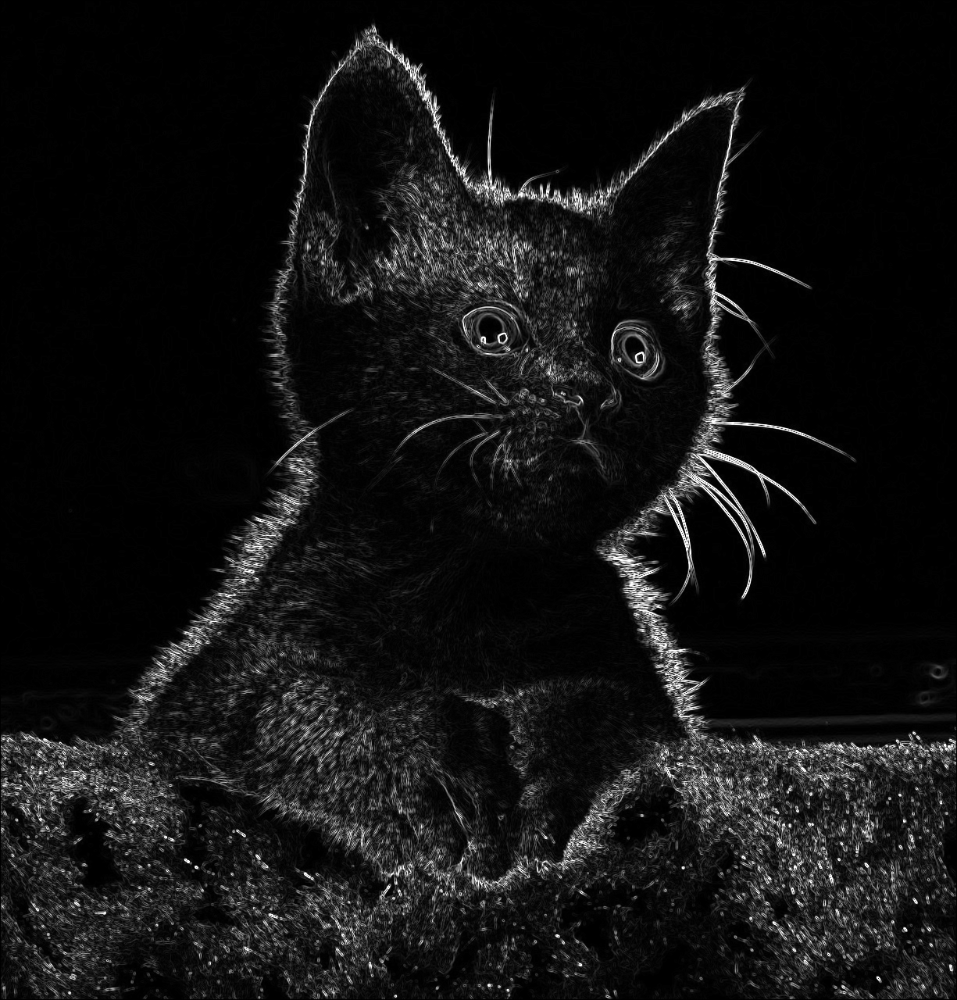

In [208]:
x_derivative, y_derivative, gradient_magnitude = computeMagniguteXY_Sobel(img)
cv2_imshow(gradient_magnitude)

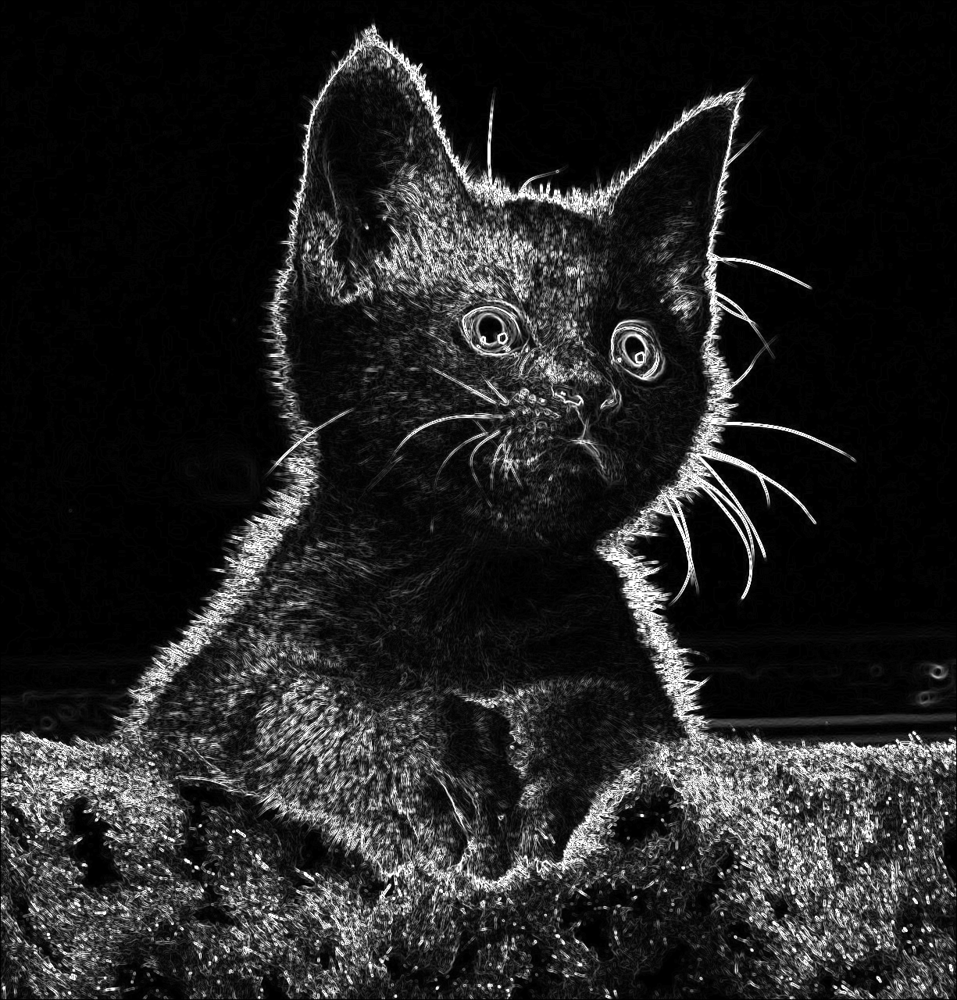

In [209]:
x_derivative, y_derivative, gradient_magnitude = computeMagniguteXY_Sobel(img, rm_frac = True)
cv2_imshow(gradient_magnitude)

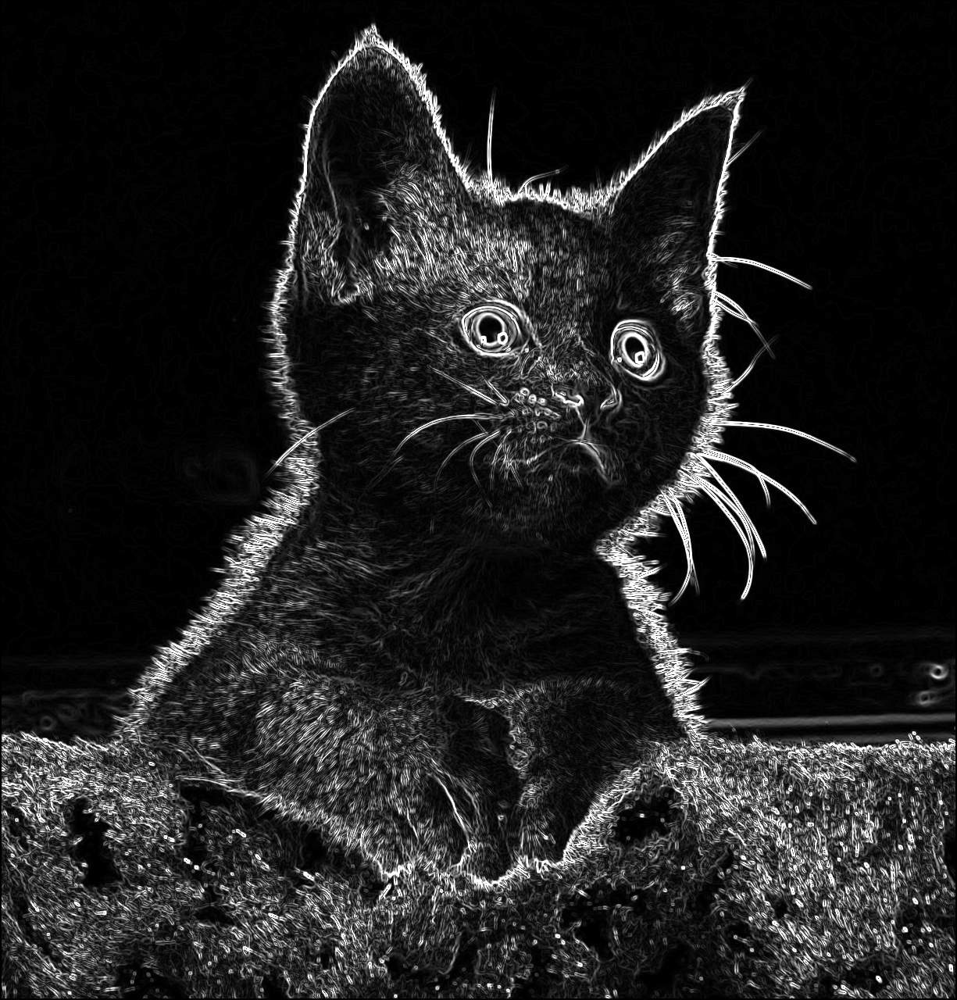

In [210]:
x_derivative, y_derivative, gradient_magnitude = computeMagniguteXY_Sobel(img, kernel_size = 5)
cv2_imshow(gradient_magnitude)

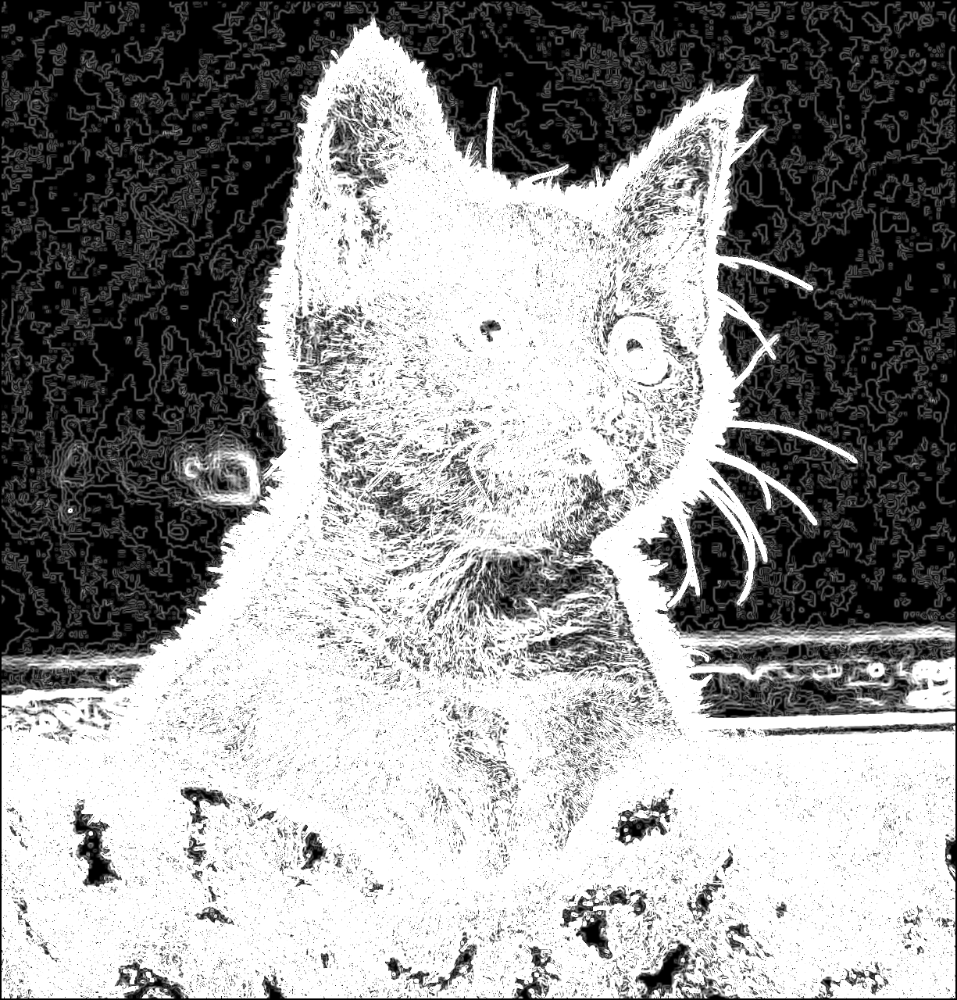

In [211]:
x_derivative, y_derivative, gradient_magnitude = computeMagniguteXY_Sobel(img, kernel_size = 5, rm_frac = True)
cv2_imshow(gradient_magnitude)

##Edge detection using built-in function (CV2)

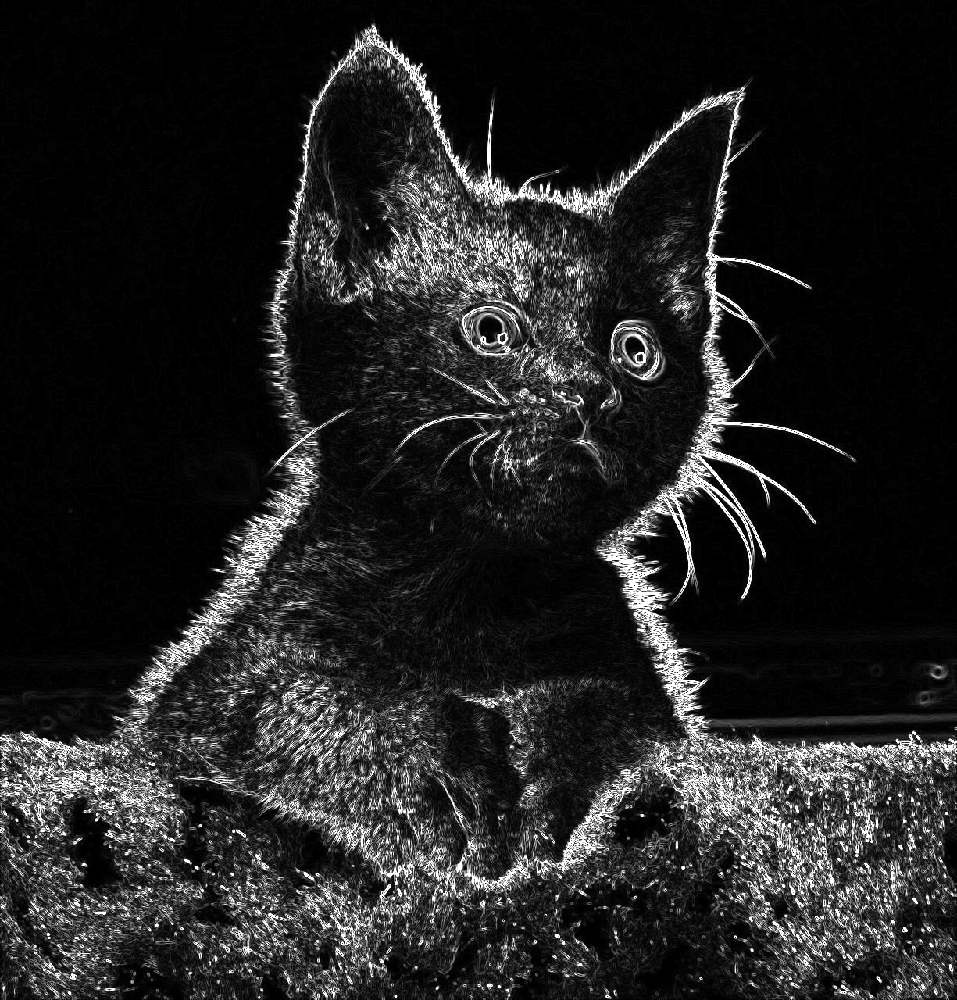

In [214]:
sobel_x = cv2.Sobel(img, cv2.CV_64F,1,0, ksize=3)
sobel_y = cv2.Sobel(img, cv2.CV_64F,0,1, ksize=3)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
cv2_imshow(gradient_magnitude)

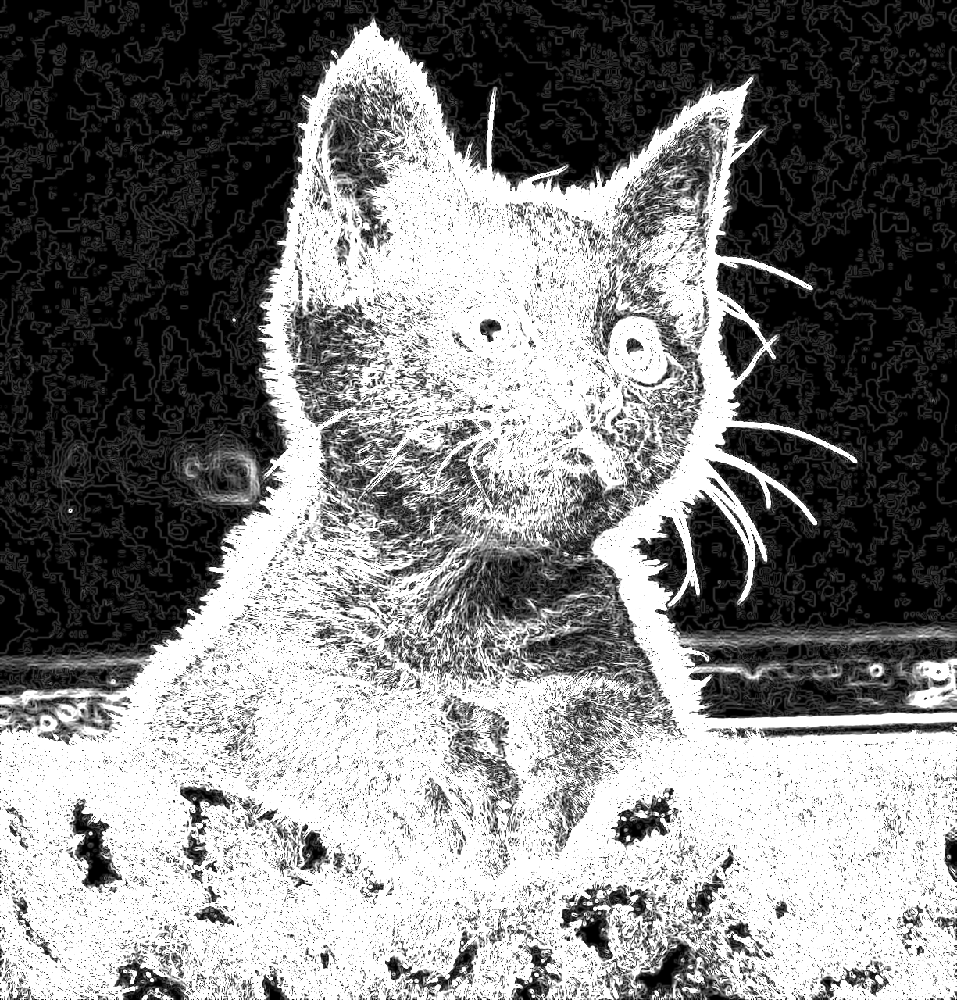

In [215]:
sobel_x = cv2.Sobel(img, cv2.CV_64F,1,0, ksize=5)
sobel_y = cv2.Sobel(img, cv2.CV_64F,0,1, ksize=5)
gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
cv2_imshow(gradient_magnitude)